In [214]:
from rdkit import Chem
from rdkit.Chem import Descriptors
import pandas as pd
import numpy as np
import random
import os
os.environ['R_HOME'] = 'C:\Programming\R\R-4.4.2'

In [215]:
# 재현성 난수 고정
SEED = 100

os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

random.seed(SEED)
np.random.seed(SEED)

In [216]:
# data load
df_name = 'logVP2'
df = pd.read_csv('C:\Programming\Github\EGCN\data\\' + df_name + '.csv')

smiles_list = df['smiles'].tolist()

# target 정의
target = df.iloc[:,-1]

print(smiles_list[:5])
print(target[:5])

['COC(F)(F)C(F)(F)C(F)(F)F', 'COC(F)(F)C(F)(F)F', 'Brc1cc(Br)c(cc1)Oc1ccc(Br)c(Br)c1Br', 'Clc1c(Oc2ccccc2)c(Cl)ccc1Cl', 'Clc1cc(Oc2ccccc2)c(Cl)c(Cl)c1']
0    2.75
1    3.21
2   -8.14
3   -3.55
4   -3.66
Name: Logvp, dtype: float64


In [217]:
# 분자 특성 추출 class
class MolecularFeatureExtractor:
    def __init__(self):
        self.descriptors = [desc[0] for desc in Descriptors._descList]

    def extract_molecular_features(self, smiles_list):
        features_dict = {desc: [] for desc in self.descriptors}

        for smiles in smiles_list:
            mol = Chem.MolFromSmiles(smiles)
            if mol:
                for descriptor_name in self.descriptors:
                    descriptor_function = getattr(Descriptors, descriptor_name)
                    try:
                        features_dict[descriptor_name].append(descriptor_function(mol))
                    except:
                        features_dict[descriptor_name].append(None)
            else:
                for descriptor_name in self.descriptors:
                    features_dict[descriptor_name].append(None)

        return pd.DataFrame(features_dict)

In [218]:
# 분자 특성 추출 및 데이터프레임 정의
extractor = MolecularFeatureExtractor()
df_all_features = extractor.extract_molecular_features(smiles_list)

df_all_features['target'] = target
df_all_features.head()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,11.734375,-6.326875,11.734375,0.055208,0.621657,200.053,197.029,200.007212,74,0,...,0,0,0,0,0,0,0,0,0,2.75
1,11.312500,-5.609375,11.312500,0.285208,0.517465,150.046,147.022,150.010406,56,0,...,0,0,0,0,0,0,0,0,0,3.21
2,5.865324,0.743609,5.865324,0.743609,0.348269,564.691,559.651,559.625725,94,0,...,0,0,0,0,0,0,0,0,0,-8.14
3,6.007009,0.317611,6.007009,0.317611,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.55
4,5.999509,0.356407,5.999509,0.356407,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.66


In [219]:
num_all_features = df_all_features.shape[1] - 1  # logvp 열 제외
print("초기 변수 개수:", num_all_features)

초기 변수 개수: 208


# 1. NA Handling

In [220]:
# NA 확인
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df_all_features[df_all_features.isna().any(axis = 1)]

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_HOCCN,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azide,fr_azo,fr_barbitur,fr_benzene,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
308,11.256944,-5.027778,11.256944,0.000000,0.318879,168.021,167.013,167.981036,54,0,1.0,-0.543727,1.0,0.543727,1.400000,1.700000,1.700000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,125.671111,7.654701,4.905705,6.905705,3.886751,1.761324,1.761324,1.211120,1.211120,0.546221,0.546221,0.089087,0.089087,0.190000,54.465006,12.830317,4.148355,2.849274,75.500432,9.901065,5.969305,0.0,0.0,0.0,41.905260,0.0,8.78083,8.78083,0.0,0.0,0.0,0.0,0.0,57.020011,5.969305,0.0,0.0,0.0,12.347974,0.000000,0.000000,0.0,0.0,34.663813,17.561660,0.0,0.000000,18.317279,4.794537,0.0,0.000000,0.000000,0.000000,0.0,0.0,40.13,18.317279,17.561660,0.0,29.557286,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,9.901065,44.298889,0.000000,9.121389,9.121389,0.000000,-8.085648,0.000000,-4.206019,0.000000,0.000000,0.666667,10,0,2,0,0,0,0,0,0,2,0,7,2,0,0,0,0,-3.3593,15.9580,1,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-3.52
366,9.493706,-3.574962,9.493706,0.261312,0.392848,228.181,211.045,228.076275,86,0,NaN,NaN,NaN,NaN,1.285714,1.785714,2.142857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.282710,190.619041,11.190234,8.682121,9.682121,6.469674,3.880758,5.552716,2.437754,4.506097,1.424649,3.036393,0.672954,1.481212,-0.230000,840.985362,13.770000,6.290392,4.854469,83.713211,0.000000,0.000000,0.0,0.0,0.0,82.856603,0.0,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,28.308043,8.170218,0.0,0.0,0.0,13.213764,21.329393,11.835185,0.0,0.0,0.000000,0

In [221]:
# 결측치가 포함된 feature 개수
print('결측치가 포함된 열 개수:', df_all_features.isna().any(axis = 0).sum(), '\n')
print(df_all_features.isna().any(axis = 0))

결측치가 포함된 열 개수: 12 

MaxEStateIndex              False
MinEStateIndex              False
MaxAbsEStateIndex           False
MinAbsEStateIndex           False
qed                         False
MolWt                       False
HeavyAtomMolWt              False
ExactMolWt                  False
NumValenceElectrons         False
NumRadicalElectrons         False
MaxPartialCharge             True
MinPartialCharge             True
MaxAbsPartialCharge          True
MinAbsPartialCharge          True
FpDensityMorgan1            False
FpDensityMorgan2            False
FpDensityMorgan3            False
BCUT2D_MWHI                  True
BCUT2D_MWLOW                 True
BCUT2D_CHGHI                 True
BCUT2D_CHGLO                 True
BCUT2D_LOGPHI                True
BCUT2D_LOGPLOW               True
BCUT2D_MRHI                  True
BCUT2D_MRLOW                 True
BalabanJ                    False
BertzCT                     False
Chi0                        False
Chi0n                       

In [222]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

In [223]:
# 결측치가 포함된 feature 제거
df_removed_features = df_all_features.dropna(axis = 1)
num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features)

제거 후 남은 feature 개수: 196


In [224]:
# 결측치가 제거된 data frame
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,11.734375,-6.326875,11.734375,0.055208,0.621657,200.053,197.029,200.007212,74,0,...,0,0,0,0,0,0,0,0,0,2.75
1,11.312500,-5.609375,11.312500,0.285208,0.517465,150.046,147.022,150.010406,56,0,...,0,0,0,0,0,0,0,0,0,3.21
2,5.865324,0.743609,5.865324,0.743609,0.348269,564.691,559.651,559.625725,94,0,...,0,0,0,0,0,0,0,0,0,-8.14
3,6.007009,0.317611,6.007009,0.317611,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.55
4,5.999509,0.356407,5.999509,0.356407,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2708,9.318056,0.750000,9.318056,0.750000,0.328596,70.091,64.043,70.041865,28,0,...,0,0,0,0,0,0,0,0,0,1.48
2709,10.487732,-1.045355,10.487732,0.296852,0.875514,235.066,227.002,233.985049,76,0,...,0,0,0,0,0,0,0,0,0,-6.73
2710,11.316003,-1.860735,11.316003,0.010741,0.575409,406.929,400.881,403.816881,108,0,...,0,0,0,0,0,0,0,0,0,-6.17
2711,2.120370,1.232734,2.120370,1.232734,0.615524,180.250,168.154,180.093900,68,0,...,0,0,0,0,0,0,0,0,0,-2.61


# 2. nunique == 1 인 경우

In [225]:
unique_columns = list(df_removed_features.loc[:, df_removed_features.nunique() == 1].columns)
print('nunique == 1인 feature : \n', unique_columns, '\n')

# nunique == 1인 feature 제거
#df_removed_features.drop(columns = unique_columns, inplace = True)
df_removed_features = df_removed_features.drop(columns = unique_columns).copy()

num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)


nunique == 1인 feature : 
 ['SMR_VSA8', 'SlogP_VSA9', 'EState_VSA11', 'fr_HOCCN', 'fr_azide', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_lactam', 'fr_prisulfonamd'] 

제거 후 남은 feature 개수: 186 

(2713, 187)


In [226]:
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,11.734375,-6.326875,11.734375,0.055208,0.621657,200.053,197.029,200.007212,74,0,...,0,0,0,0,0,0,0,0,0,2.75
1,11.312500,-5.609375,11.312500,0.285208,0.517465,150.046,147.022,150.010406,56,0,...,0,0,0,0,0,0,0,0,0,3.21
2,5.865324,0.743609,5.865324,0.743609,0.348269,564.691,559.651,559.625725,94,0,...,0,0,0,0,0,0,0,0,0,-8.14
3,6.007009,0.317611,6.007009,0.317611,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.55
4,5.999509,0.356407,5.999509,0.356407,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2708,9.318056,0.750000,9.318056,0.750000,0.328596,70.091,64.043,70.041865,28,0,...,0,0,0,0,0,0,0,0,0,1.48
2709,10.487732,-1.045355,10.487732,0.296852,0.875514,235.066,227.002,233.985049,76,0,...,0,0,0,0,0,0,0,0,0,-6.73
2710,11.316003,-1.860735,11.316003,0.010741,0.575409,406.929,400.881,403.816881,108,0,...,0,0,0,0,0,0,0,0,0,-6.17
2711,2.120370,1.232734,2.120370,1.232734,0.615524,180.250,168.154,180.093900,68,0,...,0,0,0,0,0,0,0,0,0,-2.61


# 3. 너무 낮은 variance를 가지는 경우

In [227]:
low_variances = sorted(df_removed_features.var())
low_variances[:10]

[0.0003685956505713232,
 0.0003685956505713232,
 0.00036859565057132326,
 0.0007369194754416352,
 0.0007369194754416353,
 0.0007369194754416353,
 0.0014727516480792248,
 0.001472751648079225,
 0.001474382602285293,
 0.0018402599958465035]

In [228]:
columns_low_variances = []

len = 0
for i in low_variances:
    if i < 0.001:
        column = df_removed_features.loc[:, df_removed_features.var() == i].columns
        columns_low_variances.append(column)
columns_low_variances = [item for index in columns_low_variances for item in index]

# 2. 중복 제거 및 유니크 값 추출
columns_low_variances = list(set(columns_low_variances))
print(columns_low_variances)

['fr_hdrzone', 'fr_quatN', 'fr_guanido', 'fr_tetrazole', 'fr_thiocyan', 'fr_barbitur']


In [229]:
# 낮은 분산의 변수 제거
df_removed_features = df_removed_features.drop(columns = columns_low_variances).copy()
num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)

제거 후 남은 feature 개수: 180 

(2713, 181)


In [230]:
print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)

제거 후 남은 feature 개수: 180 

(2713, 181)


In [231]:
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_pyridine,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,11.734375,-6.326875,11.734375,0.055208,0.621657,200.053,197.029,200.007212,74,0,...,0,0,0,0,0,0,0,0,0,2.75
1,11.312500,-5.609375,11.312500,0.285208,0.517465,150.046,147.022,150.010406,56,0,...,0,0,0,0,0,0,0,0,0,3.21
2,5.865324,0.743609,5.865324,0.743609,0.348269,564.691,559.651,559.625725,94,0,...,0,0,0,0,0,0,0,0,0,-8.14
3,6.007009,0.317611,6.007009,0.317611,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.55
4,5.999509,0.356407,5.999509,0.356407,0.662096,273.546,266.490,271.956248,82,0,...,0,0,0,0,0,0,0,0,0,-3.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2708,9.318056,0.750000,9.318056,0.750000,0.328596,70.091,64.043,70.041865,28,0,...,0,0,0,0,0,0,0,0,0,1.48
2709,10.487732,-1.045355,10.487732,0.296852,0.875514,235.066,227.002,233.985049,76,0,...,0,0,0,0,0,0,0,0,0,-6.73
2710,11.316003,-1.860735,11.316003,0.010741,0.575409,406.929,400.881,403.816881,108,0,...,0,0,0,0,0,0,0,0,0,-6.17
2711,2.120370,1.232734,2.120370,1.232734,0.615524,180.250,168.154,180.093900,68,0,...,0,0,0,0,0,0,0,0,0,-2.61


# 4. 데이터 스크리닝 (ISIS)

In [232]:
X_train = df_removed_features.drop(columns = 'target')
y_train = df_removed_features['target']

print(X_train.shape)
print(y_train.shape)

(2713, 180)
(2713,)


In [233]:
# 스케일링
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaling = scaler.transform(X_train)
print(X_train_scaling.shape)

(2713, 180)


In [234]:
# Python to R type
from rpy2.robjects import r
from rpy2.robjects import pandas2ri
from rpy2.robjects import FloatVector

pandas2ri.activate()

X_train_scaling = r['as.matrix'](X_train_scaling)

y_train = FloatVector(y_train)

nfolds = 10
nfolds = FloatVector([nfolds])[0]

nsis = 100
nsis = FloatVector([nsis])[0]

seed = 9
seed = FloatVector([seed])[0]

In [235]:
from rpy2.robjects.packages import importr
import sys
import io

SIS = importr('SIS')

# R 출력이 발생할 때 UTF-8 오류를 방지하기 위해, 표준 출력을 임시로 바꿔서 처리할 수 있습니다.
#r('Sys.setlocale("LC_ALL", "C.UTF-8")')

# model1 = SIS(...)
model1 = SIS.SIS(X_train_scaling,y_train,
    family="gaussian",
#    penalty="MCP",
    tune="cv",
    nfolds=nfolds,
    nsis=nsis,
    varISIS="aggr",
    seed=seed,
    q = 0.95,
    standardize=False)


Iter 1 , screening:  1 3 4 6 7 8 9 15 16 17 18 19 20 21 22 23 24 25 26 30 33 34 35 40 44 45 46 55 56 67 71 81 89 96 98 100 101 106 107 140 
Iter 1 , selection:  1 4 7 9 16 19 21 22 23 24 26 33 34 35 40 44 45 46 55 67 71 81 89 96 98 100 101 106 107 
Iter 1 , conditional-screening:  5 6 8 14 17 18 25 27 28 29 30 49 50 52 63 65 66 74 78 79 80 85 86 87 88 90 92 93 94 95 99 102 105 108 117 120 122 123 129 132 138 139 140 143 
Iter 2 , screening:  1 4 5 6 7 8 9 14 16 17 18 19 21 22 23 24 25 26 27 28 29 30 33 34 35 40 44 45 46 49 50 52 55 63 65 66 67 71 74 78 79 80 81 85 86 87 88 89 90 92 93 94 95 96 98 99 100 101 102 105 106 107 108 117 120 122 123 129 132 138 139 140 143 
Iter 2 , selection:  4 5 14 19 27 29 35 45 49 50 63 67 74 79 80 87 88 89 93 94 100 105 117 122 123 129 132 138 139 143 
Iter 2 , conditional-screening:  6 7 8 9 15 16 17 18 20 23 24 25 33 34 57 58 64 65 66 68 84 90 91 92 95 96 102 103 104 107 118 119 120 135 137 154 159 171 
Iter 3 , screening:  4 5 6 7 8 9 14 15 16 17 18 

In [236]:
print(str(model1))

$sis.ix0
 [1]   1   3   4   6   7   8   9  15  16  17  18  19  20  21  22  23  24  25  26
[20]  30  33  34  35  40  44  45  46  55  56  67  71  81  89  96  98 100 101 106
[39] 107 140

$ix
 [1]   4   5  11  19  29  35  36  38  47  49  52  53  57  58  63  67  68  69  74
[20]  78  87  88  89  94  99 100 104 106 111 117 124 129 132 135 136 139 144 152
[39] 153 154 157 169 171

$coef.est
 (Intercept)           X4           X5          X11          X19          X29 
-2.040744563  0.249388122 -0.211517466  0.142235906 -2.262692687  0.020981718 
         X35          X36          X38          X47          X49          X52 
-0.166666655 -0.181110687  0.115917980 -0.018750190 -0.840128151  0.164771285 
         X53          X57          X58          X63          X67          X68 
 0.010465780 -0.187928010  0.254555738 -0.147433512 -0.256965113 -1.039267407 
         X69          X74          X78          X87          X88          X89 
 0.385982014 -0.226606030  0.216433007  0.194833369 -0.19488

In [237]:
print(df_removed_features.shape)
print('\n')
print(df_removed_features.columns)


(2713, 181)


Index(['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons', 'NumRadicalElectrons',
       ...
       'fr_pyridine', 'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone',
       'fr_term_acetylene', 'fr_thiazole', 'fr_thiophene', 'fr_unbrch_alkane',
       'fr_urea', 'target'],
      dtype='object', length=181)


In [238]:
# 선택된 feature들의 index
selected_features_ISIS = np.array(model1.rx2('ix'))

# R은 index가 1부터 시작하므로 python에 맞게 보정
selected_features_ISIS = selected_features_ISIS - 1
selected_features_ISIS

array([  3,   4,  10,  18,  28,  34,  35,  37,  46,  48,  51,  52,  56,
        57,  62,  66,  67,  68,  73,  77,  86,  87,  88,  93,  98,  99,
       103, 105, 110, 116, 123, 128, 131, 134, 135, 138, 143, 151, 152,
       153, 156, 168, 170])

In [239]:
df_removed_features_columns = df_removed_features.columns
print(f'ISIS 적용 전 features: {df_removed_features_columns.size}개')
print(df_removed_features_columns, '\n')

selected_features = df_removed_features_columns[selected_features_ISIS]
print(f'ISIS 적용 후 features: {selected_features.size}개')
print(selected_features)

ISIS 적용 전 features: 181개
Index(['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons', 'NumRadicalElectrons',
       ...
       'fr_pyridine', 'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone',
       'fr_term_acetylene', 'fr_thiazole', 'fr_thiophene', 'fr_unbrch_alkane',
       'fr_urea', 'target'],
      dtype='object', length=181) 

ISIS 적용 후 features: 43개
Index(['MinAbsEStateIndex', 'qed', 'FpDensityMorgan1', 'Chi1', 'Ipc',
       'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA13', 'PEOE_VSA9', 'SMR_VSA10',
       'SMR_VSA4', 'SMR_VSA5', 'SlogP_VSA1', 'SlogP_VSA10', 'SlogP_VSA4',
       'SlogP_VSA8', 'TPSA', 'EState_VSA1', 'EState_VSA5', 'EState_VSA9',
       'VSA_EState8', 'VSA_EState9', 'FractionCSP3',
       'NumAliphaticHeterocycles', 'NumHAcceptors', 'NumHDonors',
       'NumSaturatedHeterocycles', 'RingCount', 'fr_Al_OH_noTert', 'fr_COO',
       'fr_NH1', 'fr_Nhpyrrole', 'fr_alkyl_carba

In [240]:
df_ISIS = df_removed_features[list(selected_features) + ['target']]
df_ISIS

,MinAbsEStateIndex,qed,FpDensityMorgan1,Chi1,Ipc,PEOE_VSA10,PEOE_VSA11,PEOE_VSA13,PEOE_VSA9,SMR_VSA10,...,fr_amidine,fr_azo,fr_ether,fr_ketone,fr_ketone_Topliss,fr_lactone,fr_nitrile,fr_piperdine,fr_priamide,target
0,0.055208,0.621657,0.833333,5.060660,182.985021,0.000000,0.000000,0.0,0.000000,0.000000,...,0,0,1,0,0,0,0,0,0,2.75
1,0.285208,0.517465,1.000000,3.810660,49.093584,0.000000,0.000000,0.0,0.000000,0.000000,...,0,0,1,0,0,0,0,0,0,3.21
2,0.743609,0.348269,0.666667,8.486071,10731.652068,11.499024,0.000000,0.0,8.945439,79.649719,...,0,0,1,0,0,0,0,0,0,-8.14
3,0.317611,0.662096,0.750000,7.681541,5185.359008,10.772145,5.749512,0.0,10.045267,34.802820,...,0,0,1,0,0,0,0,0,0,-3.55
4,0.356407,0.662096,0.875000,7.664704,4856.503346,16.521657,0.000000,0.0,5.022633,34.802820,...,0,0,1,0,0,0,0,0,0,-3.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2708,0.750000,0.328596,1.600000,2.414214,11.245112,6.286161,0.000000,0.0,0.000000,6.286161,...,0,0,0,0,0,0,0,0,0,1.48
2709,0.296852,0.875514,1.500000,6.502908,1093.608500,5.749512,6.103966,0.0,5.022633,29.171185,...,0,0,1,0,0,0,0,0,0,-6.73
2710,0.010741,0.575409,0.947368,8.686411,17026.561798,9.748345,4.333354,0.0,23.278337,80.966956,...,0,0,0,0,0,0,0,0,0,-6.17
2711,1.232734,0.615524,0.500000,6.949490,2714.305287,0.000000,0.000000,0.0,0.000000,12.152040,...,0,0,0,0,0,0,0,0,0,-2.61


# 5. 엘라스틱 넷

In [241]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE

In [242]:
X_ISIS = df_ISIS.drop(columns = ['target'])
y_ISIS = df_ISIS['target']

# train / test split
X_train, X_test, y_train, y_test = train_test_split(X_ISIS, y_ISIS, test_size = 0.2, random_state = SEED)

# scaling
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaling = scaler.transform(X_train)
X_test_scaling = scaler.transform(X_test)

print(X_train_scaling.shape)
print(X_test_scaling.shape)

(2170, 43)
(543, 43)


In [243]:
# ElasticNet 모델과 하이퍼파라미터 범위 설정
elastic_net = ElasticNet(max_iter = 5000)
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # 정규화 강도
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]  # L1과 L2 비율
}

kfold = KFold(n_splits = 5, shuffle = True, random_state = SEED)

# GridSearchCV를 사용하여 최적 하이퍼파라미터 탐색
grid_search = GridSearchCV(
    estimator = elastic_net,
    param_grid = param_grid,
    scoring = 'neg_mean_squared_error',
    cv = kfold,
    verbose = 1,
    n_jobs = -1
)

grid_search.fit(X_train_scaling, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             estimator=ElasticNet(max_iter=5000), n_jobs=-1,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
                         'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]},
             scoring='neg_mean_squared_error', verbose=1)

In [244]:
best_params = grid_search.best_params_
print(best_params)

{'alpha': 0.01, 'l1_ratio': 0.7}


In [291]:
# 최적 하이퍼파라미터로 ElasticNet 모델 생성
best_params = grid_search.best_params_

best_elastic_net = ElasticNet(
    alpha = best_params['alpha'],
    l1_ratio = best_params['l1_ratio'],
    max_iter = 5000,
    fit_intercept=True
)

In [292]:
X_train

,MinAbsEStateIndex,qed,FpDensityMorgan1,Chi1,Ipc,PEOE_VSA10,PEOE_VSA11,PEOE_VSA13,PEOE_VSA9,SMR_VSA10,...,fr_amide,fr_amidine,fr_azo,fr_ether,fr_ketone,fr_ketone_Topliss,fr_lactone,fr_nitrile,fr_piperdine,fr_priamide
1369,0.041281,0.437491,0.538462,6.414214,8.127028e+02,0.000000,0.000000,0.00000,52.855056,0.000000,...,0,0,0,3,0,0,0,0,0,0
912,1.045139,0.410432,2.000000,2.414214,1.124511e+01,0.000000,0.000000,0.00000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
2643,0.398148,0.448946,1.833333,2.642734,1.360964e+01,0.000000,0.000000,0.00000,0.000000,5.907180,...,1,0,0,0,0,0,0,0,0,1
1806,0.238704,0.731363,0.937500,7.701907,3.922209e+03,0.000000,0.000000,0.00000,24.340667,11.938611,...,0,0,0,2,0,0,0,0,0,0
433,1.271667,0.494284,1.333333,2.914214,2.098630e+01,0.000000,0.000000,0.00000,0.000000,11.761885,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,0.304682,0.903915,0.909091,10.562882,8.302763e+04,5.749512,0.000000,0.00000,7.109798,23.561253,...,2,0,0,2,0,0,0,0,0,0
1930,1.430556,0.386981,2.000000,1.414214,2.754888e+00,0.000000,0.000000,0.00000,6.069221,0.000000,...,0,0,0,0,0,0,0,1,0,0
79,0.010870,0.399558,0.969697,15.451416,1.207949e+07,27.970038,0.000000,5.90718,10.586085,40.827560,...,3,0,0,1,0,0,0,0,0,0
1859,0.839167,0.585589,0.833333,5.328427,2.624342e+02,0.000000,11.077851,0.00000,12.138443,0.000000,...,0,0,1,0,0,0,0,2,0,0


In [293]:
# 학습
best_elastic_net.fit(X_train_scaling, y_train)

# 회귀 계수
coefficients = best_elastic_net.coef_

# feature와 계수 매핑
final_selected_features = pd.DataFrame({'Feature' : X_train.columns,
                                       'Coefficient' : coefficients})
# 계수
final_selected_features = abs(final_selected_features['Coefficient']).sort_values(ascending = False)
final_selected_features_index = final_selected_features.index
final_selected_features_index

Index([ 3, 16,  9, 25, 36, 17, 23, 18, 13,  0, 24, 29, 15, 12, 21, 35, 19, 27,
        6, 20,  1, 38, 34, 28,  2, 31,  7, 42,  5, 26, 22, 10, 37, 32, 33, 39,
       14, 11,  8, 30, 40, 41,  4],
      dtype='int64')

In [294]:
final_selected_features_index.size

43

In [249]:
# 최종 변수 출력
num_features = [3, 5, 7, 10, 20]
dfs = {}

for i in num_features:
    print(f'변수 {i}개: ', list(X_train.columns[final_selected_features_index[: i]]), '\n')
    dfs[f'df_name_{i}'] = list(X_train.columns[final_selected_features_index[: i]])

변수 3개:  ['Chi1', 'TPSA', 'SMR_VSA10'] 

변수 5개:  ['Chi1', 'TPSA', 'SMR_VSA10', 'NumHDonors', 'fr_ether'] 

변수 7개:  ['Chi1', 'TPSA', 'SMR_VSA10', 'NumHDonors', 'fr_ether', 'EState_VSA1', 'NumAliphaticHeterocycles'] 

변수 10개:  ['Chi1', 'TPSA', 'SMR_VSA10', 'NumHDonors', 'fr_ether', 'EState_VSA1', 'NumAliphaticHeterocycles', 'EState_VSA5', 'SlogP_VSA10', 'MinAbsEStateIndex'] 

변수 20개:  ['Chi1', 'TPSA', 'SMR_VSA10', 'NumHDonors', 'fr_ether', 'EState_VSA1', 'NumAliphaticHeterocycles', 'EState_VSA5', 'SlogP_VSA10', 'MinAbsEStateIndex', 'NumHAcceptors', 'fr_COO', 'SlogP_VSA8', 'SlogP_VSA1', 'VSA_EState9', 'fr_azo', 'EState_VSA9', 'RingCount', 'PEOE_VSA11', 'VSA_EState8'] 



In [252]:
best_elastic_net.coef_.size

43

## p-value 사용

In [295]:
best_elastic_net.intercept_

-2.103797235023041

In [306]:
import statsmodels.api as sm

X_selected = X_train.iloc[:, best_elastic_net.coef_ != 0]  # 계수가 0이 아닌 변수만 선택
X_selected = sm.add_constant(X_selected)  # 상수항 추가
ols_model = sm.OLS(y_train, X_selected).fit()

ols_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.917
Model:                            OLS   Adj. R-squared:                  0.915
Method:                 Least Squares   F-statistic:                     560.1
Date:                   화, 03 12 2024   Prob (F-statistic):               0.00
Time:                        18:03:49   Log-Likelihood:                -3164.3
No. Observations:                2170   AIC:                             6415.
Df Residuals:                    2127   BIC:                             6659.
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        3.9405      0.210     18.784      0.000       3.529       4.352
MinAbsEStateIndex            0.3350      0.050      6.658      0.000       0.236       0.434
qed                         -1.2364      0.212     -5.828      0.000      -1.652      -0.820
FpDensityMorgan1             0.3275      0.082      3.985      0.000       0.166       0.489
Chi1                        -0.8122      0.027    -30.147      0.000      -0.865      -0.759
PEOE_VSA10                  -0.0287      0.006     -4.519      0.000      -0.041      -0.016
PEOE_VSA11                  -0.0397      0.007     -5.572      0.000      -0.054      -0.026
PEOE_VSA13                   0.0722      0.014      5.301      0.000       0.045       0.099
PEOE_VSA9                   -0.0096      0.005     -2.097      0.036      -0.019      -0.001
SMR_VSA10                   -0.0448      0.002    -18.772      0.000      -0.049      -0.040
SMR_VSA4                     0.0311      0.008      3.840      0.000       0.015       0.047
SMR_VSA5                     0.0078      0.003      2.879      0.004       0.002       0.013
SlogP_VSA1                  -0.0646      0.010     -6.551      0.000      -0.084      -0.045
SlogP_VSA10                  0.0425      0.006      7.253      0.000       0.031       0.054
SlogP_VSA4                  -0.0134      0.006     -2.390      0.017      -0.024      -0.002
SlogP_VSA8                  -0.0405      0.007     -5.906      0.000      -0.054      -0.027
TPSA                        -0.0395      0.003    -12.059      0.000      -0.046      -0.033
EState_VSA1                  0.0404      0.005      8.322      0.000       0.031       0.050
EState_VSA5                 -0.0146      0.002     -6.487      0.000      -0.019      -0.010
EState_VSA9                  0.0154      0.003      5.730      0.000       0.010       0.021
VSA_EState8                  0.0357      0.011      3.185      0.001       0.014       0.058
VSA_EState9                 -0.1314      0.021     -6.401      0.000      -0.172      -0.091
FractionCSP3                 0.0761      0.112      0.678      0.498      -0.144       0.296
NumAliphaticHeterocycles    -1.1702      0.142     -8.263      0.000      -1.448      -0.892
NumHAcceptors                0.2421      0.042      5.813      0.000       0.160       0.324
NumHDonors                  -0.7560      0.074    -10.185      0.000      -0.902      -0.610
NumSaturatedHeterocycles     0.5490      0.161      3.408      0.001       0.233       0.865
RingCount                   -0.0838      0.059     -1.414      0.157      -0.200       0.032
fr_Al_OH_noTert             -0.4476      0.093     -4.833      0.000      -0.629      -0.266
fr_COO                      -0.7972      0.120     -6.630      0.000      -1.033      -0.561
fr_NH1        

In [300]:
print(X_train.columns[ols_model.pvalues <= 0.05])
print(X_train.columns[ols_model.pvalues <= 0.05].size)


IndexError: boolean index did not match indexed array along dimension 0; dimension is 43 but corresponding boolean dimension is 42

## permutation importance (사용 X)

In [ ]:
# from sklearn.inspection import permutation_importance

# threshold = 0.005

# result = permutation_importance(best_elastic_net, X_test_scaling, y_test, random_state = SEED)

# importances = result.importances_mean
# sorted_idx = importances.argsort()[::-1]

# threshold_selected_features = X_train.columns[sorted_idx]
# threshold_selected_features = threshold_selected_features[importances[sorted_idx] >  threshold]
# print(list(threshold_selected_features))
# print(threshold_selected_features.size)


['Chi1', 'TPSA', 'SMR_VSA10', 'NumHDonors', 'EState_VSA1', 'fr_ether', 'MinAbsEStateIndex', 'SlogP_VSA10', 'EState_VSA5', 'NumAliphaticHeterocycles', 'NumHAcceptors', 'fr_amidine', 'VSA_EState9', 'EState_VSA9', 'SlogP_VSA8', 'PEOE_VSA11']
16


# 예측

In [253]:
y_pred = best_elastic_net.predict(X_test_scaling)

In [254]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))


1.1512687736939056
0.9002833052545294


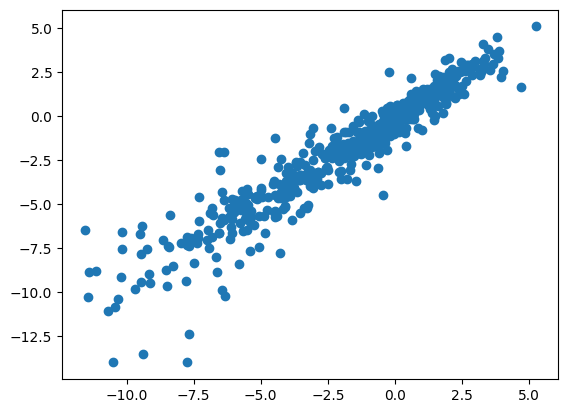

In [255]:
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred)
plt.show()

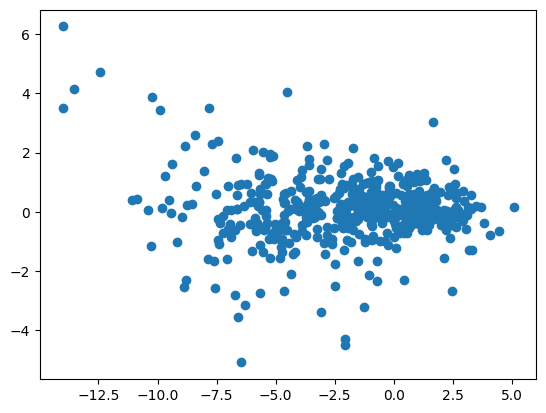

In [256]:
# 잔차 플랏
resid = y_test - y_pred

plt.scatter(y_pred, resid)
plt.show()

In [257]:
# # RFE 실행 (최종적으로 10개의 특성 선택)
# num_features = [3, 5, 7, 10, 20]
# for i in num_features:
#     rfe = RFE(estimator=optimal_elastic_net, n_features_to_select= i)
#     rfe.fit(X_train, y_train)

#     # RFE로 선택된 특성 이름 확인
#     selected_features_indices = rfe.support_
#     selected_features_names = X.columns[selected_features_indices]
#     print("최종 선택된 특성:", list(selected_features_names))

# # # 최종 선택된 특성으로 데이터프레임 생성
# # df_final_selected = ISIS_df[selected_features_names.tolist() + ['target']]
# # print("최종 데이터프레임:")
# # print(df_final_selected.head())